#**Import and install dependencies on colab**

In [ ]:
!pip install umap-learn
!pip install phate scprep s_gd2
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn import decomposition
cmap='BuGn_r'
lol= ['#a61551','#d9424d','#f67b4a','#febf6f','#feefa4','#f2f9a9','#bee5a0','#75c8a5','#388eba','#5e50a2']    


MNIST DATA SET

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split

import umap

sns.set(context="paper", style="white")

mnist = fetch_openml("mnist_784", version=1)
X_train, X_test, y_train, y_test = train_test_split(
    mnist.data, mnist.target, stratify=mnist.target, random_state=42,train_size=0.9
)

In [ ]:

sns.set(context="paper", style="white")

SGD ALGORITHM

In [ ]:
import s_gd2
from scipy.spatial.distance import pdist, squareform

In [ ]:
def sgd(D, n_components=2, random_state=None, init=None,num_dimensions=None):
    """Metric MDS using stochastic gradient descent
    Parameters
    ----------
    D : array-like, shape=[n_samples, n_samples]
        pairwise distances
    n_components : int, optional (default: 2)
        number of dimensions in which to embed `D`
    random_state : int or None, optional (default: None)
        numpy random state
    init : array-like or None
        Initialization algorithm or state to use for MMDS
    Returns
    -------
    Y : array-like, embedded data [n_sample, ndim]
    """

    N = D.shape[0]
    D = squareform(D)
    # Metric MDS from s_gd2
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state,num_dimensions=num_dimensions)
    return Y

PCA

In [ ]:
from sklearn import decomposition
#Dimensionality reduction using PCA, denoise and better capture of the global structure 
#of the data for UMAP proyection
pca = decomposition.PCA(n_components=500,random_state=1)
pca.fit(X_test)
X = pca.transform(X_test)
print(X.shape)

(7000, 500)


VISUALAZING PICTURES

In [ ]:
from matplotlib import offsetbox

def plot_components(data, proj, images=None, ax=None,
                    thumb_frac=0.01, cmap='gray'):
    ax = ax or plt.gca()
    
    proj = proj
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 5
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)

#**PCA manifold** 

In [ ]:
distance_matrix_dist =pdist(X)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
PCA_MSD_sdg = sgd(distance_matrix_u_pca,num_dimensions=2)
PCA_MSD_sdg

array([[  575.30322522,  1622.01610494],
       [  623.77090005,  2124.44261797],
       [ -685.91345946, -2594.93073905],
       ...,
       [-2327.12112898,   541.98840131],
       [-1746.63174534,   776.75127943],
       [ 1885.37859955,   745.15290001]])

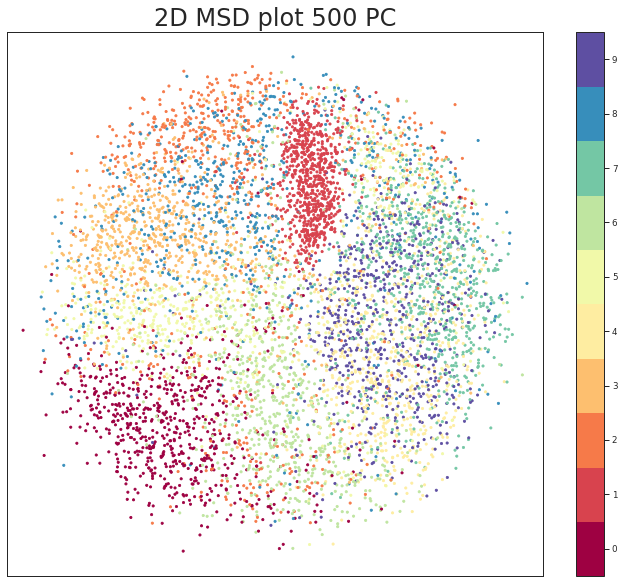

In [ ]:
import seaborn as sns; sns.set()
sns.set(context="paper", style="white")

fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_MSD_sdg[:, 0], PCA_MSD_sdg[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D MSD plot 500 PC', fontsize=24);

In [ ]:
PCA_3DMSD_sdg = sgd(distance_matrix_u_pca,num_dimensions=3)
PCA_3DMSD_sdg

array([[-1245.63330172,    -6.28142068,   998.8561711 ],
       [-1082.58493576,  -451.23449222,  1612.80389559],
       [ 2237.63852011, -1135.45720259,  -620.30305009],
       ...,
       [ 1125.90134525,  1859.60681106,   531.05102798],
       [ 1072.58946534,  1074.67213147,  1211.76383571],
       [-1184.49738088, -1564.71657649,   258.41469158]])

In [ ]:
PCA_3DMSD_DF = pd.DataFrame(PCA_3DMSD_sdg, columns=['MDS1', 'MDS2','MDS3']) 


In [ ]:
import plotly.express as px
import plotly as offline

fig = px.scatter_3d(PCA_3DMSD_DF, x='MDS1', y='MDS2', z='MDS3',color= y_test.astype('category'), color_discrete_sequence=lol)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'})
fig.update_traces(marker=dict(size=5),
                  selector=dict(mode='markers'))
fig.update_layout(title_text='UMAP',
                      showlegend=True,
                      legend=dict(orientation="h", yanchor="top", y=0, xanchor="center", x=0.5),
                      scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                            center=dict(x=0, y=0, z=-0.1),
                                            eye=dict(x=1.5, y=-1.4, z=0.5)),
                                            margin=dict(l=0, r=0, b=0, t=0),
                      scene = dict(xaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             ),
                                   yaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                              ),
                                   zaxis=dict(backgroundcolor='lightgrey',
                                              color='black', 
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             )))
fig.update_layout(scene_aspectmode='cube')
#fig.write_html("3D MSD plot 100 PC.html")

In [ ]:
fig.write_html("3D MSD plot 500 PC.html")

#**Diffusion on the PCA manifold** 

In [ ]:
knn= 30
decay= 15
t=5
distance_matrix_dist =pdist(X)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
n,m =distance_matrix_u_pca.shape

E = np.zeros((m,m))
knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    
epsilon = knn_dst[:,knn]
    
    
pdx_scale = (distance_matrix_u_pca / epsilon).T 
    
E = np.exp(-1 * ( pdx_scale ** decay))
    
print(' afinity matrix done')
    
A = (E + E.T)
    
diff_deg = np.diag(np.sum(A,0))
    
diff_op = np.dot(np.diag(np.diag(diff_deg)**(-1)),A)
    

new_matrix_pca =  np.linalg.matrix_power(diff_op, t)

 afinity matrix done


In [ ]:
distance_matrix_dist =pdist(new_matrix_pca)
distance_matrix_u_pca = (squareform(distance_matrix_dist))

In [ ]:
PCA_diff_MSD_sdg = sgd(distance_matrix_u_pca,num_dimensions=2)
PCA_diff_MSD_sdg

array([[0.47748452, 0.51900662],
       [0.48394382, 0.5170751 ],
       [0.53133251, 0.45146979],
       ...,
       [0.52050118, 0.49659791],
       [0.50679892, 0.50820297],
       [0.45621707, 0.4921454 ]])

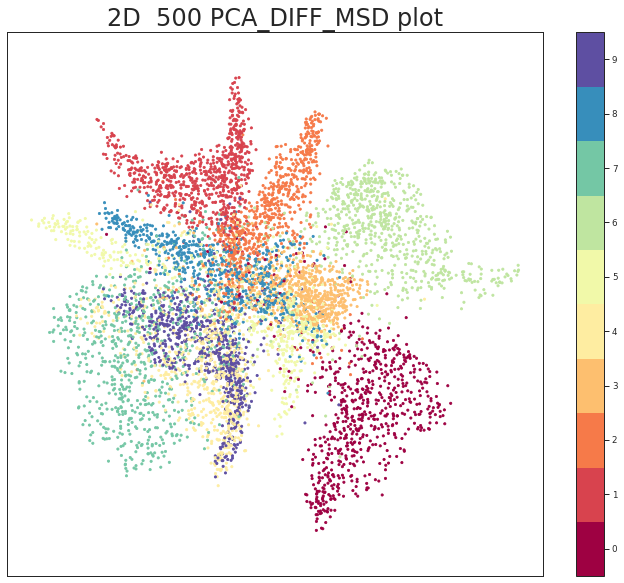

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_diff_MSD_sdg[:, 0], PCA_diff_MSD_sdg[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D  500 PCA_DIFF_MSD plot', fontsize=24);

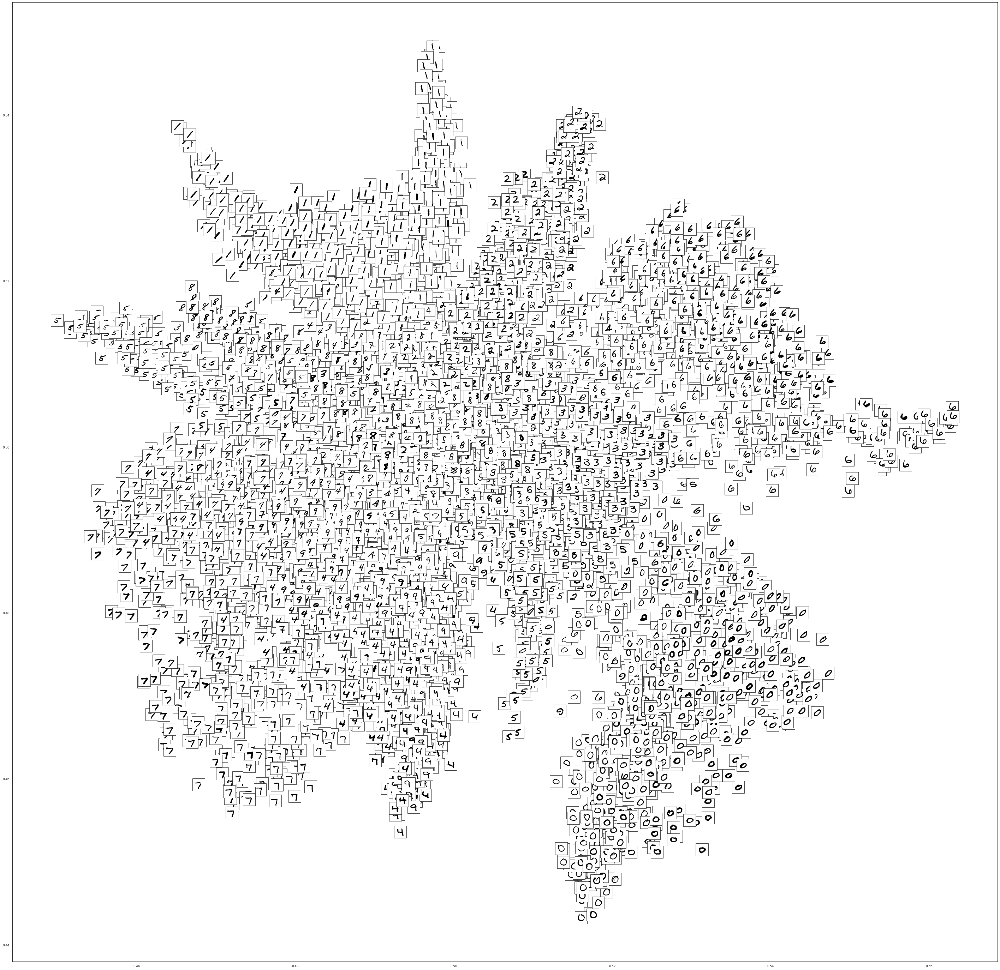

In [ ]:
fig, ax = plt.subplots(figsize=(50, 50))
data_2 = X_test
proj_2 = PCA_diff_MSD_sdg
plot_components (data_2, proj_2, images=np.array(data_2).reshape((-1, 28, 28)),ax=ax, thumb_frac=0.00001, cmap='gray_r')

In [ ]:
PCA_diff_3D_MSD_sdg = sgd(distance_matrix_u_pca,num_dimensions=3)
PCA_diff_3D_MSD_sdg

array([[0.50445721, 0.47122467, 0.48529308],
       [0.5041009 , 0.47326994, 0.49234766],
       [0.49597109, 0.54494146, 0.47523353],
       ...,
       [0.52460455, 0.50244707, 0.5047031 ],
       [0.51627838, 0.49424549, 0.49001501],
       [0.48123449, 0.48204304, 0.46417515]])

In [ ]:
PCA_DIFF_3DMSD_DF = pd.DataFrame(PCA_diff_3D_MSD_sdg, columns=['MDS1', 'MDS2','MDS3']) 


In [ ]:
import plotly.express as px
import plotly as offline

fig = px.scatter_3d(PCA_DIFF_3DMSD_DF, x='MDS1', y='MDS2', z='MDS3',color= y_test.astype('category'), color_discrete_sequence=lol)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'})
fig.update_traces(marker=dict(size=5),
                  selector=dict(mode='markers'))
fig.update_layout(title_text='UMAP',
                      showlegend=True,
                      legend=dict(orientation="h", yanchor="top", y=0, xanchor="center", x=0.5),
                      scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                            center=dict(x=0, y=0, z=-0.1),
                                            eye=dict(x=1.5, y=-1.4, z=0.5)),
                                            margin=dict(l=0, r=0, b=0, t=0),
                      scene = dict(xaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             ),
                                   yaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                              ),
                                   zaxis=dict(backgroundcolor='lightgrey',
                                              color='black', 
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             )))
fig.update_layout(scene_aspectmode='cube')

#fig.write_html("3D MSD plot 100 PC.html")

In [ ]:
fig_3D_PCA_DIFF_MDS= fig
fig_3D_PCA_DIFF_MDS.write_html("3D PCA_DIFF_MSD plot 500 PC.html")

#**Diffusion on the PCA-UMAP manifold** 

In [ ]:
fit = umap.UMAP(n_components =60,random_state=1,metric='cosine',verbose=True,n_neighbors=5,min_dist=0.3,n_epochs=10000)
%time u_pca_umap = fit.fit_transform(X)

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.3, n_components=60, n_epochs=10000, n_neighbors=5, random_state=1, verbose=True)
Wed Dec 29 21:09:37 2021 Construct fuzzy simplicial set
Wed Dec 29 21:09:37 2021 Finding Nearest Neighbors
Wed Dec 29 21:09:37 2021 Building RP forest with 9 trees
Wed Dec 29 21:09:37 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	Stopping threshold met -- exiting after 5 iterations
Wed Dec 29 21:09:38 2021 Finished Nearest Neighbor Search
Wed Dec 29 21:09:38 2021 Construct embedding


Epochs completed:   0%|            0/10000 [00:00]

Wed Dec 29 21:16:26 2021 Finished embedding
CPU times: user 6min 45s, sys: 3.49 s, total: 6min 49s
Wall time: 6min 48s


In [ ]:
knn= 50
decay= 15
t=10
distance_matrix_dist =pdist(u_pca_umap)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
n,m =distance_matrix_u_pca.shape

E = np.zeros((m,m))
knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    
epsilon = knn_dst[:,knn]
    
    
pdx_scale = (distance_matrix_u_pca / epsilon).T 
    
E = np.exp(-1 * ( pdx_scale ** decay))
    
print(' afinity matrix done')
    
A = (E + E.T)
    
diff_deg = np.diag(np.sum(A,0))
    
diff_op = np.dot(np.diag(np.diag(diff_deg)**(-1)),A)
    

new_matrix_pca_umap_diff =  np.linalg.matrix_power(diff_op, t)

 afinity matrix done


In [ ]:
distance_matrix_dist =pdist(new_matrix_pca_umap_diff)
distance_matrix_pca_umap_diff = (squareform(distance_matrix_dist))

In [ ]:
PCA_UMAP_diff_MSD_sdg = sgd(distance_matrix_pca_umap_diff,num_dimensions=2)
PCA_UMAP_diff_MSD_sdg

array([[0.48235182, 0.433646  ],
       [0.48222779, 0.45450518],
       [0.48411048, 0.57253923],
       ...,
       [0.51816487, 0.49277908],
       [0.50352119, 0.47888118],
       [0.44993835, 0.49032947]])

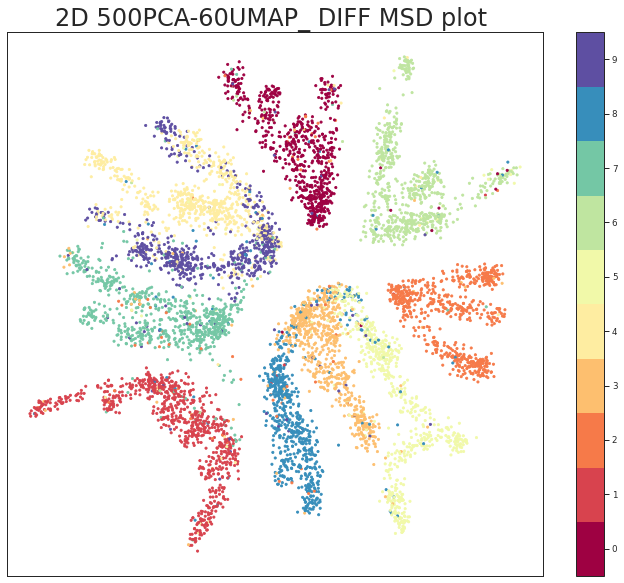

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_UMAP_diff_MSD_sdg[:, 0], PCA_UMAP_diff_MSD_sdg[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D 500PCA-60UMAP_ DIFF MSD plot ', fontsize=24);

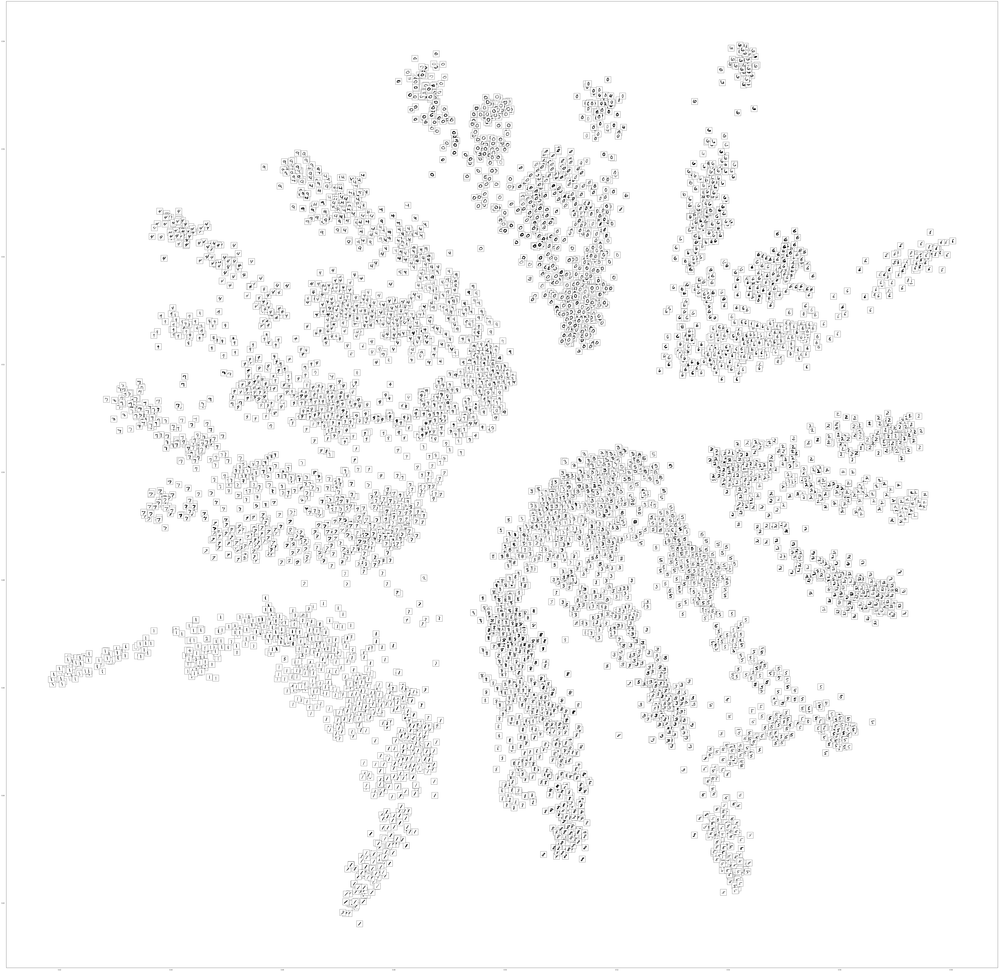

In [ ]:
fig, ax = plt.subplots(figsize=(100, 100))
data_2 = X_test
proj_2 = PCA_UMAP_diff_MSD_sdg
plot_components (data_2, proj_2, images=np.array(data_2).reshape((-1, 28, 28)),ax=ax, thumb_frac=0.00001, cmap='gray_r')

In [ ]:
PCA_UMAP_diff_3D_MSD_sdg = sgd(distance_matrix_pca_umap_diff,num_dimensions=3)
PCA_UMAP_diff_3D_MSD_sdg

array([[0.5273086 , 0.54224881, 0.5443364 ],
       [0.52678373, 0.53712309, 0.52453662],
       [0.4463923 , 0.55283715, 0.52031299],
       ...,
       [0.48198257, 0.51872245, 0.49846713],
       [0.49869276, 0.50115228, 0.47953133],
       [0.54539875, 0.49481958, 0.52386229]])

In [ ]:
PCA_UMAP_DIFF_3D_MSD_DF = pd.DataFrame(PCA_UMAP_diff_3D_MSD_sdg, columns=['MDS1', 'MDS2','MDS3']) 


In [ ]:
import plotly.express as px
import plotly as offline

fig = px.scatter_3d(PCA_UMAP_DIFF_3D_MSD_DF, x='MDS1', y='MDS2', z='MDS3',color= y_test.astype('category'), color_discrete_sequence=lol)

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.update_layout({'plot_bgcolor':'rgba(0,0,0,0)'})
fig.update_traces(marker=dict(size=3),
                  selector=dict(mode='markers'))
fig.update_layout(title_text='UMAP',
                      showlegend=True,
                      legend=dict(orientation="h", yanchor="top", y=0, xanchor="center", x=0.5),
                      scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                            center=dict(x=0, y=0, z=-0.1),
                                            eye=dict(x=1.5, y=-1.4, z=0.5)),
                                            margin=dict(l=0, r=0, b=0, t=0),
                      scene = dict(xaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             ),
                                   yaxis=dict(backgroundcolor='white',
                                              color='black',
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                              ),
                                   zaxis=dict(backgroundcolor='lightgrey',
                                              color='black', 
                                              gridcolor='#f0f0f0',
                                              title_font=dict(size=10),
                                              tickfont=dict(size=10),
                                             )))
fig.update_layout(scene_aspectmode='cube')
#fig.write_html("3D MSD plot 100 PC.html")

In [ ]:
fig_3D_PCA_UMAP_DIFF_MDS= fig
fig_3D_PCA_UMAP_DIFF_MDS.write_html("3D PCA_UMAP_DIFF_MSD plot 500 PC.html")

In [ ]:
import phate
phate_op = phate.PHATE(knn=5,n_pca=500)
data_phate = phate_op.fit_transform(X_test)

Calculating PHATE...
  Running PHATE on 7000 observations and 784 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 4.11 seconds.
    Calculating KNN search...
    Calculated KNN search in 41.87 seconds.
    Calculating affinities...
    Calculated affinities in 0.47 seconds.
  Calculated graph and diffusion operator in 46.49 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.85 seconds.
    Calculating KMeans...
    Calculated KMeans in 19.16 seconds.
  Calculated landmark operator in 21.48 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 4.86 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.78 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 7.28 seconds.
Calculated PHATE in 82.92 seconds.


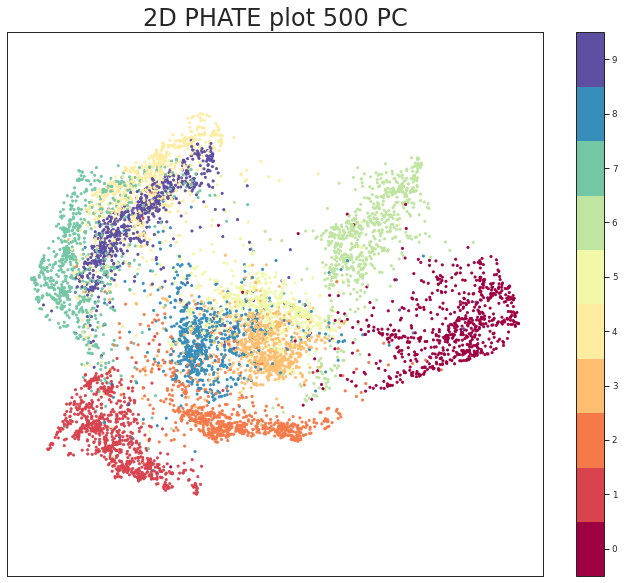

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(data_phate[:, 0], data_phate[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D PHATE plot 500 PC', fontsize=24);

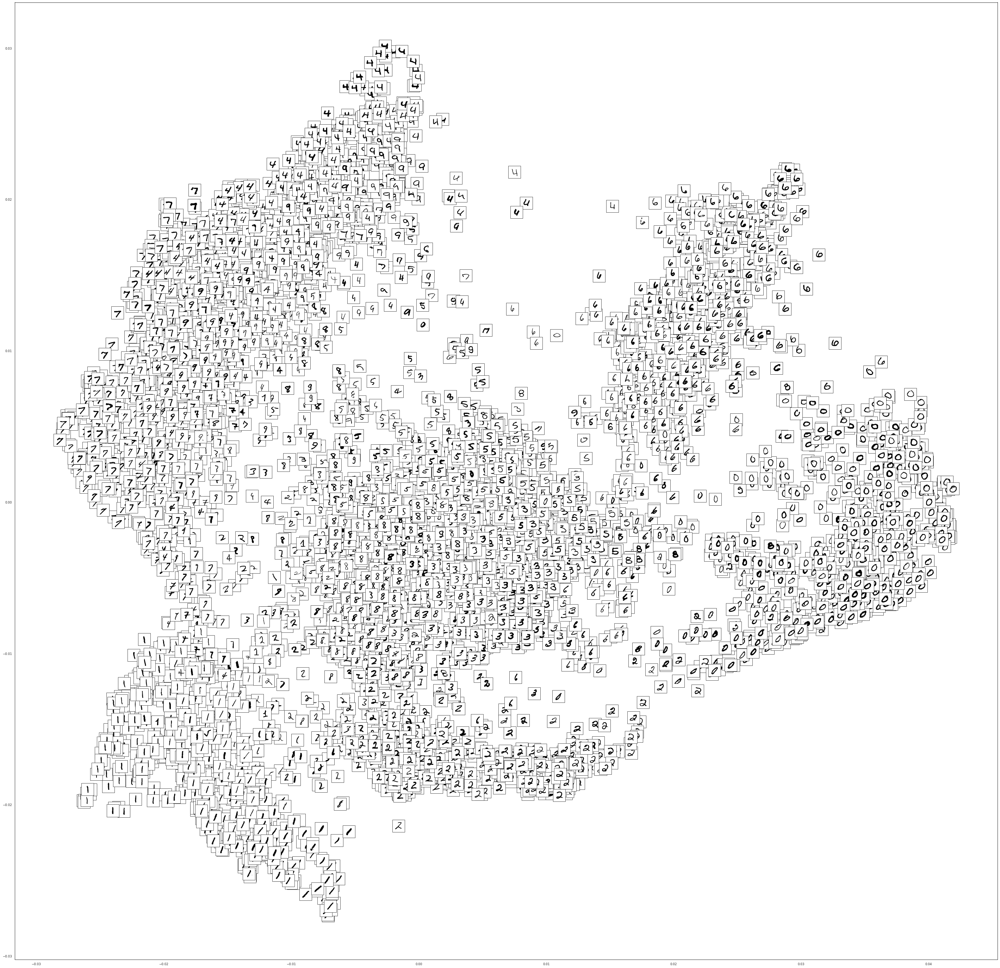

In [ ]:
fig, ax = plt.subplots(figsize=(50, 50))
data_2 = X_test
proj_2 = data_phate
plot_components (data_2, proj_2, images=np.array(data_2).reshape((-1, 28, 28)),ax=ax, thumb_frac=0.00001, cmap='gray_r')

In [ ]:
fit = umap.UMAP(n_components =2,random_state=1,metric='cosine',verbose=True,n_neighbors=5,min_dist=0.3,n_epochs=10000)
%time u_pca_umap = fit.fit_transform(X)

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.3, n_epochs=10000, n_neighbors=5, random_state=1, verbose=True)
Wed Dec 29 22:29:23 2021 Construct fuzzy simplicial set
Wed Dec 29 22:29:23 2021 Finding Nearest Neighbors
Wed Dec 29 22:29:23 2021 Building RP forest with 9 trees
Wed Dec 29 22:29:24 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	Stopping threshold met -- exiting after 5 iterations
Wed Dec 29 22:29:24 2021 Finished Nearest Neighbor Search
Wed Dec 29 22:29:24 2021 Construct embedding


Epochs completed:   0%|            0/10000 [00:00]

Wed Dec 29 22:33:23 2021 Finished embedding
CPU times: user 3min 52s, sys: 1.81 s, total: 3min 53s
Wall time: 3min 59s


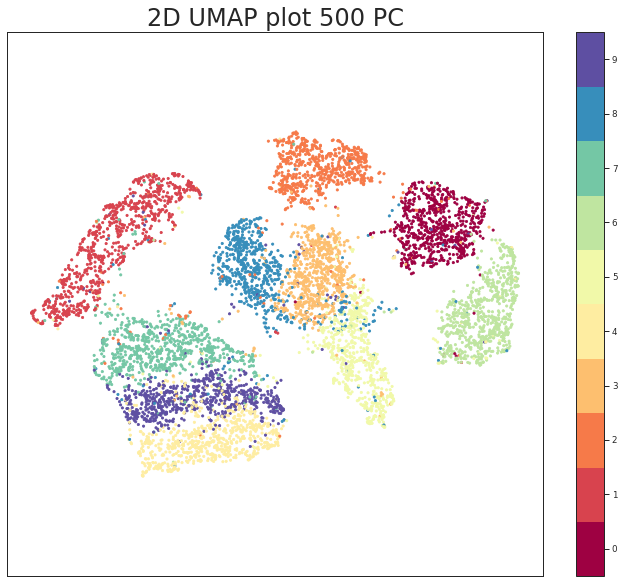

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(u_pca_umap[:, 0], u_pca_umap[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D UMAP plot 500 PC', fontsize=24);

In [ ]:
fit = umap.UMAP(n_components =2,random_state=1,metric='euclidean',verbose=True,n_neighbors=5,min_dist=0.3,n_epochs=10000)
%time u_pca_umap_2 = fit.fit_transform(X)

UMAP(min_dist=0.3, n_epochs=10000, n_neighbors=5, random_state=1, verbose=True)
Wed Dec 29 22:34:18 2021 Construct fuzzy simplicial set
Wed Dec 29 22:34:18 2021 Finding Nearest Neighbors
Wed Dec 29 22:34:18 2021 Building RP forest with 9 trees
Wed Dec 29 22:34:19 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	 5  /  13
	Stopping threshold met -- exiting after 5 iterations
Wed Dec 29 22:34:26 2021 Finished Nearest Neighbor Search
Wed Dec 29 22:34:26 2021 Construct embedding


Epochs completed:   0%|            0/10000 [00:00]

Wed Dec 29 22:38:27 2021 Finished embedding
CPU times: user 4min, sys: 1.66 s, total: 4min 1s
Wall time: 4min 8s


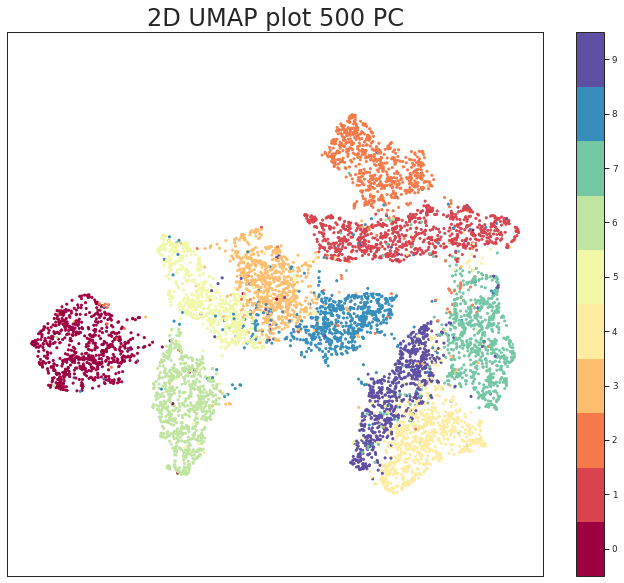

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(u_pca_umap_2[:, 0], u_pca_umap_2[:, 1], c=y_test.astype(int), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D UMAP plot 500 PC', fontsize=24);

#**Real data**

In [ ]:
import pandas as pd
import numpy as np
import os 
#count matrix
!gdown --id 10AUDnRh7mitOBOQzo0DLLict_EnlpbtG
!gdown --id 17h8H0axCYGNE5XEkupb6LGNQUFx06Pvd

Downloading...
From: https://drive.google.com/uc?id=10AUDnRh7mitOBOQzo0DLLict_EnlpbtG
To: /content/expression_matrix.txt
100% 126M/126M [00:01<00:00, 122MB/s]
Downloading...
From: https://drive.google.com/uc?id=17h8H0axCYGNE5XEkupb6LGNQUFx06Pvd
To: /content/clusters.txt
100% 52.6k/52.6k [00:00<00:00, 3.41MB/s]


In [ ]:
#este funciona
data = pd.read_table('expression_matrix.txt')
data = data.set_index('Unnamed: 0')
data = data.T
data

Unnamed: 0,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,0610009O20Rik,0610010B08Rik,0610010F05Rik,0610010K14Rik,0610010O12Rik,0610011F06Rik,0610011L14Rik,0610012G03Rik,0610012H03Rik,0610030E20Rik,0610031J06Rik,0610031O16Rik,0610037L13Rik,0610037P05Rik,0610038B21Rik,0610038L08Rik,0610039K10Rik,0610040B10Rik,0610040F04Rik,0610040J01Rik,0610043K17Rik,0910001L09Rik,100043387,1100001G20Rik,1110001A16Rik,1110001J03Rik,1110002B05Rik,1110002L01Rik,...,mt_AK154943,mt_AK157367,mt_AK159184,mt_AK159262,mt_AK159675,mt_AK162500,mt_AK162543,mt_AK163440,mt_AK165190,mt_AK165865,mt_AK166684,mt_AK166798,mt_AK166978,mt_AK167037,mt_AK167184,mt_AK201028,mt_AK214359,mt_BC004586,mt_BC006023,mt_BC008260,mt_BC012020,mt_BC020072,mt_BC020382,mt_BC055066,mt_BC069931,mt_BC071253,mt_BC081549,mt_BC104337,mt_BC128309,mt_DQ539915,mt_DQ540229,mt_DQ719271,mt_DQ719488,mt_DQ725839,mt_EF437370,mt_FR668231,mt_FW313083,mt_GU332589,mt_X57779,mt_X57780
A01101401,0.0,76.13,0.05,0.0,0.00,0.00,0.00,0.0,0.0,0.09,40.23,0.0,59.98,0.78,21.04,0.11,30.17,50.79,35.07,0.81,0.0,11.22,79.74,0.0,7.57,100.78,0.0,0.0,0.00,0.0,16.46,0.0,0.0,0.00,12.49,0.0,21.42,42.27,0.00,0.00,...,21.79,8.07,0.00,203.78,0.80,443.14,400.17,603.55,1139.51,355.30,0.00,0.00,0.00,626.24,106.99,0.00,0.0,633.99,0.01,451.56,1268.00,451.56,232.64,0.00,7.94,147.44,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1401.76,242.94,242.94
A01101402,0.0,512.73,10.11,0.0,0.00,146.61,0.00,0.0,0.0,0.00,117.27,0.0,0.00,0.15,0.00,93.17,0.00,129.82,0.00,2.86,0.0,0.44,157.84,0.0,58.61,117.91,0.0,0.0,0.00,0.0,1.80,0.0,0.0,0.00,0.00,0.0,0.00,83.38,0.00,0.12,...,9.56,0.00,140.93,128.61,0.00,842.24,210.66,81.94,448.03,1148.52,4.33,0.00,0.00,527.39,65.09,34.87,0.0,98.88,265.14,514.85,473.41,514.85,197.29,0.00,0.00,0.00,0.00,0.0,76.64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1397.16,539.54,539.54
A01101403,0.0,172.75,0.00,0.0,0.00,23.65,0.00,0.0,0.0,72.72,213.23,0.0,0.00,1.79,0.00,0.00,100.94,55.60,0.00,0.00,0.0,0.66,140.10,0.0,10.20,0.00,0.0,0.0,0.00,0.0,0.44,0.0,3.4,25.95,27.07,0.0,27.60,0.00,0.00,30.76,...,25.72,5.64,0.00,498.32,3.46,549.73,327.62,427.72,781.96,492.48,0.00,5.28,5.28,505.60,86.48,151.62,0.0,802.15,0.00,198.09,622.29,198.09,184.55,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,332.88,341.45,341.45
A01101404,0.0,170.56,0.02,0.0,0.00,117.60,0.00,0.0,0.0,125.81,131.59,0.0,0.00,15.65,0.02,71.71,38.27,0.64,0.05,1.55,0.0,0.30,78.68,0.0,32.53,152.55,0.0,0.0,0.00,0.0,4.62,0.0,0.0,84.46,34.26,0.0,0.00,46.55,92.34,9.95,...,29.63,6.13,4.66,148.49,1.67,768.47,0.00,529.81,774.29,1308.47,0.00,0.00,0.00,543.47,98.32,0.00,0.0,874.52,0.00,493.22,896.81,493.22,260.83,0.00,3.07,35.16,0.01,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1442.66,260.02,260.02
A01101405,0.0,113.87,0.04,0.0,0.00,180.93,0.00,0.0,0.0,0.10,56.41,0.0,0.03,17.25,0.00,0.10,59.07,15.61,0.04,1.02,0.0,0.30,96.24,0.0,311.11,81.28,0.0,0.0,0.00,0.0,0.00,0.0,0.0,5.15,0.00,0.0,0.22,0.38,0.06,0.21,...,16.75,10.16,0.00,360.83,3.79,880.17,1.08,259.43,893.18,1408.48,0.00,0.00,0.00,652.72,29.88,291.43,0.0,770.80,1.12,473.38,688.11,473.38,698.81,0.00,0.90,0.44,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,749.68,348.10,348.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Z11041427,0.0,106.52,0.00,0.0,0.08,221.36,0.00,0.0,0.0,141.14,102.51,0.0,0.00,0.10,0.00,47.99,39.64,98.34,0.00,1.29,0.0,1.39,0.00,0.0,45.08,73.71,0.0,0.0,1.98,0.0,0.00,0.0,0.0,0.00,13.42,0.0,0.00,146.33,84.68,44.04,...,10.46,0.00,0.00,86.22,2.43,1504.38,198.72,454.85,901.20,1311.45,2.46,0.00,0.00,346.58,112.06,22.30,0.0,356.39,0.00,465.94,1064.37,465.94,130.53,0.00,0.00,0.00,135.33,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.

In [ ]:
clusters = pd.read_table('clusters.txt',skiprows=1)
clusters

,TYPE,group,group.1
0,A01101401,GABA_Vip,Vip_Mybpc1
1,A01101402,GABA_Vip,Vip_Parm1
2,A01101403,Gluta_L4,L4_Ctxn3
3,A01101404,GABA_Vip,Vip_Chat
4,A01101405,GABA_Vip,Vip_Parm1
...,...,...,...
1674,Z11041427,GABA_Vip,Vip_Chat
1675,Z11041428,GABA_Vip,Vip_Chat
1676,Z11041429,GABA_Vip,Vip_Chat
1677,Z11041430,GABA_Vip,Vip_Chat


In [ ]:
clusters.group

0       GABA_Vip
1       GABA_Vip
2       Gluta_L4
3       GABA_Vip
4       GABA_Vip
          ...   
1674    GABA_Vip
1675    GABA_Vip
1676    GABA_Vip
1677    GABA_Vip
1678    GABA_Vip
Name: group, Length: 1679, dtype: object

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=500, random_state=1)
pca_data= pca.fit_transform(data)

In [ ]:
import umap
fit = umap.UMAP(n_neighbors=10, verbose= True, metric='cosine', min_dist=0.5, n_epochs=1500, negative_sample_rate=5, set_op_mix_ratio=0.8, learning_rate=0.1 , local_connectivity=3, random_state=42)
%time u_no = fit.fit_transform(data)

UMAP(angular_rp_forest=True, learning_rate=0.1, local_connectivity=3, metric='cosine', min_dist=0.5, n_epochs=1500, n_neighbors=10, random_state=42, set_op_mix_ratio=0.8, verbose=True)
Thu Dec 30 01:40:21 2021 Construct fuzzy simplicial set
Thu Dec 30 01:41:27 2021 Finding Nearest Neighbors
Thu Dec 30 01:41:28 2021 Finished Nearest Neighbor Search
Thu Dec 30 01:41:28 2021 Construct embedding


Epochs completed:   0%|            0/1500 [00:00]

Thu Dec 30 01:41:39 2021 Finished embedding
CPU times: user 1min 17s, sys: 340 ms, total: 1min 17s
Wall time: 1min 19s


In [ ]:
clusters.group.unique()

array(['GABA_Vip', 'Gluta_L4', 'Gluta_L2_3', 'Gluta_L2', 'GABA_Pvalb',
       'GABA_Ndnf', 'Gluta_L5a', 'NonNeu_SMC', 'NonNeu_Astro', 'Gluta_L5',
       'NonNeu_Micro', 'NonNeu_Endo', 'GABA_Sst', 'Gluta_L6b',
       'GABA_Sncg', 'GABA_Igtp', 'NonNeu_Oligo', 'GABA_Smad3',
       'NonNeu_OPC', 'Gluta_L5b', 'Gluta_L6a'], dtype=object)

In [ ]:
target=pd.Series(clusters.group)
list_clust = list(np.arange(21))
lut = dict(zip(clusters.group.unique(), list_clust))
row_colors = target.map(lut)
row_colors

0       0
1       0
2       1
3       0
4       0
       ..
1674    0
1675    0
1676    0
1677    0
1678    0
Name: group, Length: 1679, dtype: int64

In [ ]:
list_clust

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

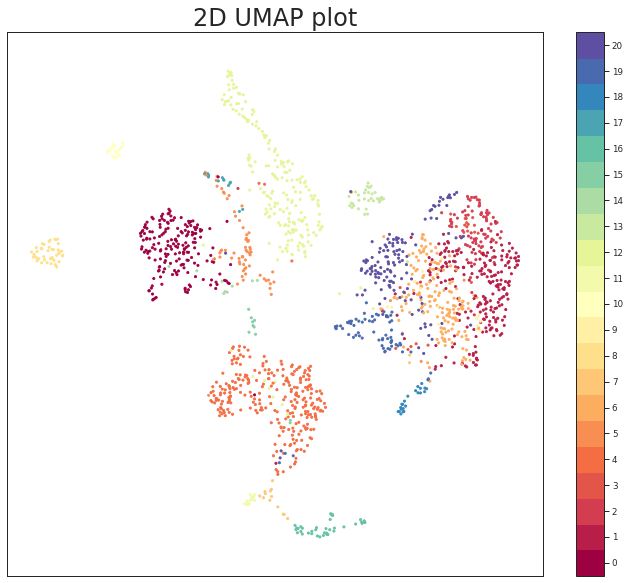

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(u_no[:, 0], u_no[:, 1], c=row_colors.astype('category'), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(22)-0.5).set_ticks(np.arange(21))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D UMAP plot', fontsize=24);

In [ ]:
knn= 30
decay= 15
t=5
distance_matrix_dist =pdist(pca_data)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
n,m =distance_matrix_u_pca.shape

E = np.zeros((m,m))
knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    
epsilon = knn_dst[:,knn]
    
    
pdx_scale = (distance_matrix_u_pca / epsilon).T 
    
E = np.exp(-1 * ( pdx_scale ** decay))
    
print(' afinity matrix done')
    
A = (E + E.T)
    
diff_deg = np.diag(np.sum(A,0))
    
diff_op = np.dot(np.diag(np.diag(diff_deg)**(-1)),A)
    

new_matrix_pca_neuro =  np.linalg.matrix_power(diff_op, t)

 afinity matrix done


In [ ]:
distance_matrix_dist_nuero =pdist(new_matrix_pca_neuro)
distance_matrix_pca_diff_neuro = (squareform(distance_matrix_dist_nuero))

In [ ]:
PCA_UMAP_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_diff_neuro,num_dimensions=2,random_state=1)
PCA_UMAP_diff_2D_MSD_sdg_neu

array([[0.52964902, 0.55496509],
       [0.51719101, 0.5245815 ],
       [0.47282949, 0.52586754],
       ...,
       [0.51301473, 0.5212185 ],
       [0.52282782, 0.53283189],
       [0.52402946, 0.53445555]])

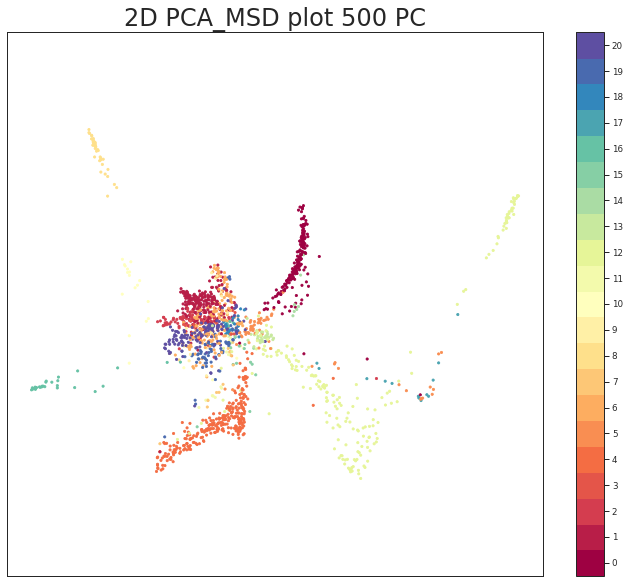

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_UMAP_diff_2D_MSD_sdg_neu[:, 0], PCA_UMAP_diff_2D_MSD_sdg_neu[:, 1], c=row_colors.astype('category'), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(22)-0.5).set_ticks(np.arange(21))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D PCA_MSD plot 500 PC', fontsize=24);

In [ ]:
import umap
fit = umap.UMAP(n_components=30, n_neighbors=5, verbose= True, metric='cosine', min_dist=0.9, n_epochs=500, random_state=42)
%time u_no_3 = fit.fit_transform(pca_data)

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.9, n_components=30, n_epochs=500, n_neighbors=5, random_state=42, verbose=True)
Thu Dec 30 01:34:17 2021 Construct fuzzy simplicial set
Thu Dec 30 01:34:20 2021 Finding Nearest Neighbors
Thu Dec 30 01:34:20 2021 Finished Nearest Neighbor Search
Thu Dec 30 01:34:21 2021 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Thu Dec 30 01:34:26 2021 Finished embedding
CPU times: user 8.94 s, sys: 158 ms, total: 9.1 s
Wall time: 8.83 s


In [ ]:
knn= 30
decay= 15
t=5
distance_matrix_dist =pdist(u_no_3)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
n,m =distance_matrix_u_pca.shape

E = np.zeros((m,m))
knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    
epsilon = knn_dst[:,knn]
    
    
pdx_scale = (distance_matrix_u_pca / epsilon).T 
    
E = np.exp(-1 * ( pdx_scale ** decay))
    
print(' afinity matrix done')
    
A = (E + E.T)
    
diff_deg = np.diag(np.sum(A,0))
    
diff_op = np.dot(np.diag(np.diag(diff_deg)**(-1)),A)
    

new_matrix_pca_umap_neuro =  np.linalg.matrix_power(diff_op, t)

 afinity matrix done


In [ ]:
distance_matrix_dist_nuero =pdist(new_matrix_pca_umap_neuro)
distance_matrix_pca_umap_diff_neuro = (squareform(distance_matrix_dist_nuero))

In [ ]:
PCA_UMAP_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_umap_diff_neuro,num_dimensions=2,random_state=1)
PCA_UMAP_diff_2D_MSD_sdg_neu

array([[0.54111579, 0.49193466],
       [0.52416817, 0.49143521],
       [0.52296045, 0.60567338],
       ...,
       [0.52185506, 0.47892923],
       [0.52187382, 0.48026236],
       [0.51974899, 0.48152566]])

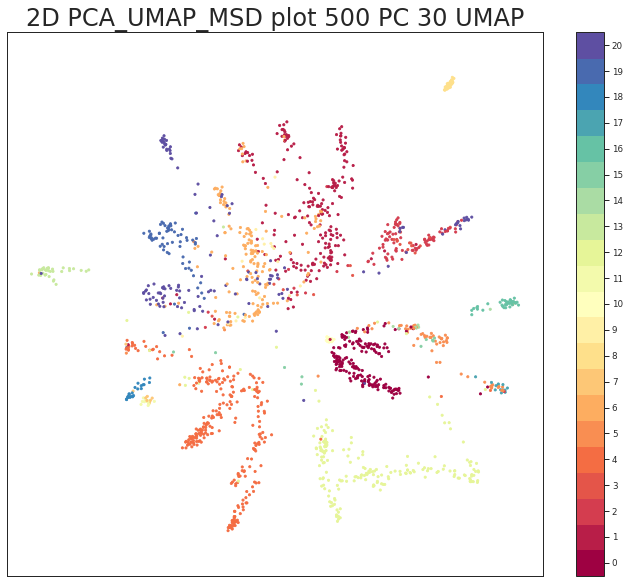

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_UMAP_diff_2D_MSD_sdg_neu[:, 0], PCA_UMAP_diff_2D_MSD_sdg_neu[:, 1], c=row_colors.astype('category'), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(22)-0.5).set_ticks(np.arange(21))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D PCA_UMAP_MSD plot 500 PC 30 UMAP', fontsize=24);

In [ ]:
import umap
fit = umap.UMAP(n_components=30, n_neighbors=5, verbose= True, metric='cosine', min_dist=0.9, n_epochs=1500, random_state=42)
%time u_no_4 = fit.fit_transform(data)

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.9, n_components=30, n_epochs=1500, n_neighbors=5, random_state=42, verbose=True)
Thu Dec 30 01:37:42 2021 Construct fuzzy simplicial set
Thu Dec 30 01:38:49 2021 Finding Nearest Neighbors
Thu Dec 30 01:38:49 2021 Finished Nearest Neighbor Search
Thu Dec 30 01:38:49 2021 Construct embedding


Epochs completed:   0%|            0/1500 [00:00]

Thu Dec 30 01:39:04 2021 Finished embedding
CPU times: user 1min 21s, sys: 393 ms, total: 1min 21s
Wall time: 1min 23s


In [ ]:
knn= 30
decay= 15
t=5
distance_matrix_dist =pdist(u_no_4)
distance_matrix_u_pca = (squareform(distance_matrix_dist))
n,m =distance_matrix_u_pca.shape

E = np.zeros((m,m))
knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    
epsilon = knn_dst[:,knn]
    
    
pdx_scale = (distance_matrix_u_pca / epsilon).T 
    
E = np.exp(-1 * ( pdx_scale ** decay))
    
print(' afinity matrix done')
    
A = (E + E.T)
    
diff_deg = np.diag(np.sum(A,0))
    
diff_op = np.dot(np.diag(np.diag(diff_deg)**(-1)),A)
    

new_matrix_pca_umap_neuro =  np.linalg.matrix_power(diff_op, t)

 afinity matrix done


In [ ]:
distance_matrix_dist_nuero =pdist(new_matrix_pca_umap_neuro)
distance_matrix_pca_umap_diff_neuro = (squareform(distance_matrix_dist_nuero))

In [ ]:
PCA_UMAP_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_umap_diff_neuro,num_dimensions=2,random_state=1)
PCA_UMAP_diff_2D_MSD_sdg_neu

array([[0.52631693, 0.58881843],
       [0.50783096, 0.57117066],
       [0.43986405, 0.43306994],
       ...,
       [0.4952199 , 0.57737358],
       [0.49495252, 0.58110067],
       [0.49435101, 0.58170867]])

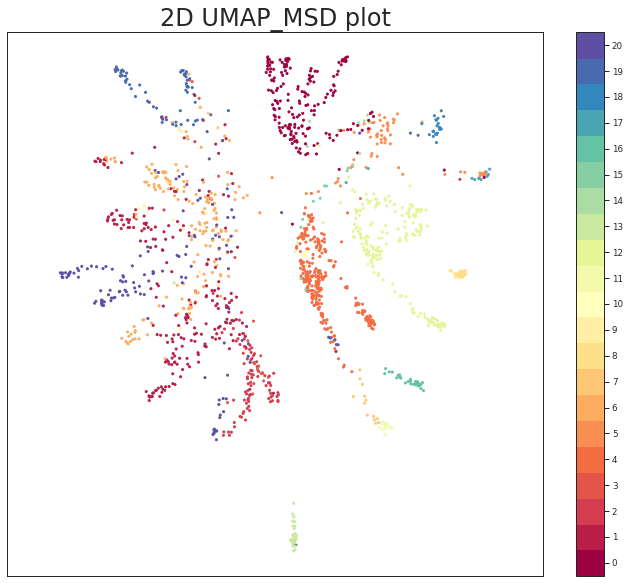

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(PCA_UMAP_diff_2D_MSD_sdg_neu[:, 0], PCA_UMAP_diff_2D_MSD_sdg_neu[:, 1], c=row_colors.astype('category'), cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(22)-0.5).set_ticks(np.arange(21))
plt.setp(ax, xticks=[], yticks=[])
plt.title('2D UMAP_MSD plot', fontsize=24);